<a href="https://colab.research.google.com/github/Walberf17/chaotic_maps/blob/main/Chaotic_maps_iterator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

"""
Creates a class to see and work
plots for caotic equations.

It just works with simple plots, with 1 or 2 variables or constants.

For use this, you need:
* A equation function, which only recieves a dict with the values of its constants and its variables.
* A dict with the initial values for the variables and constants, also 'iterations' with how many iteration to run in the initial state.

"""


# Main Class

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import random

In [ ]:
class Chaos:
    """
    This class creates a iterator like object of some cool function.
    For it to work you need to send a dict with the initial values, where each
    variable or constant name is the key and the value for it is the initial
    value for that. Also, you have to add the value for the number of iterations
    to the transient state, with the name 'iterations'
    """

    def __init__(self, values, equation=None):
        """
        This create the object with the initial values and the equation to
        iterate over.

        :param values: dict with the initial values for the equation
        :param equation: a function that takes a dictionary with the values for
        the calculation and returns a new dictionary with the next values
        """
        self.initial_values = values.copy()
        self.values = values
        self.iter_once = equation

    def iter(self, times=1)-> None:
        """
        Iterates over the equation to get new values.
        Changes in place and doesn't return anything.
        """
        for _ in range(int(times)):
            self.change_values(self.iter_once(self.values))

    def change_initial_values(self, new_values:dict)->None:
        """
        Updates the values for the initial values of the dict for the
        new values passed in the dict.
        :param new_values: dict with the new_values
        """
        a = list(new_values.keys())
        b = list(self.initial_values.keys())
        assert set(a+b) == set(b), f'Diferent Variables. \n    Expected: \n          {b}. \n    Got: \n          {a}.'
        self.initial_values = self.initial_values|new_values

    def change_values(self, values_dict):
        """
        Update the values for each equation
        """
        a = list(values_dict.keys())
        b = list(self.values.keys())
        assert set(a+b) == set(b), f'There are values outside the ones in the equation'
        for element, value in values_dict.items():
            self.values[element] = value

    def create_array(self, size, new_values=None):
        """

        """
        if new_values is None:
            new_values = self.initial_values

        self.init_chaos(new_values)
        values_array = {}

        for _ in range(size):
            self.iter()
            for var, value in self.values.items():
                if var not in values_array:
                    values_array[var] = []
                values_array[var].append(value)
        return values_array

    def init_chaos(self, new_values=None):
        """
        Initiates the equation with the values given or the initial values, then iter for given times,
        changing the values for each iteration
        :param new_values: None or dict with the new initial values
        """
        if new_values is None:
            new_values = self.initial_values

        a = list(new_values.keys())
        b = list(self.initial_values.keys())
        assert set(a+b) == set(b), f'Diferent Variables. \n    Expected: \n          {b}. \n    Got: \n          {a}.'

        self.values = self.initial_values|new_values

        self.iter(self.values.get('iterations', 1))

    def show_all_graphs_2d(self, variables = None, size = 100):
        if variables is None:
            variables = list(self.values.keys())
        vals = self.create_array(size)
        for x in variables:
            for y in variables:
                if x == y:
                    continue

                print("#"*50)

                X = vals.get(x)
                Y = vals.get(y)

                plt.plot(X, Y)
                plt.xlabel(x)
                plt.ylabel(y)
                plt.title(f'Values of {x} x {y}')
                plt.show()

    def show_histogram(self, variables=None, size=100):
        vals = self.create_array(size)
        if variables is None:
            variables = list(self.values.keys())
        for x in variables:
            print("#"*50)
            plt.hist(vals.get(x))
            plt.title(x)
            plt.show()

    def show_graph(self, x, y=None,*, z=None, size=100,**args):
        if z is None:
            self.show_graph_2d(x, y , size, **args)
        else:
            self.show_graph_3d(x, y, z, size, **args)

    def show_graph_2d(self, x, y=None, size=100, **args):
        vals = self.create_array(size)

        X = vals.get(x)
        if y is None:
            X = list(range(len(X)))
            Y = vals.get(x)
            title = f'Values of {x.capitalize()} in time.'
            xlabel = '$n^{th}$ iteration'
            ylabel = x.capitalize()
        else:
            Y = vals.get(y)
            title = f'Values of {x.capitalize()} x {y.capitalize()}'
            xlabel = x.capitalize()
            ylabel = y.capitalize()
        s = 5/(size/100)
        plt.scatter(X, Y, color='k', s=s, **args)
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.title(title)
        plt.show()

    def show_graph_3d(self, x, y, z, size, **args):
        ...

    def show_bifurcation_graph(self, x, initial_val, end_val, how_many, y, size):
        """
        :param x: str with the name for the x parameter
        :param initial_val: float for the initial value for parameter x
        :param end_val: float for the end value for parameter x
        :param how_many: int with steps from the initial and final values for x
        :param y: str with the name of the variable to find
        :param size: how many values of y to find
        """


        X = np.linspace(initial_val, end_val, how_many)
        values = self.initial_values

        xs = []
        ys = []
        for x_val in X:
            if x in values:
                values[x] = x_val

            else:
                raise NameError(f'There is no such variable or constante as {x}.')
            self.init_chaos(values)

            array_values = self.create_array(size = size)
            for value in array_values[y]:
                xs.append(x_val)
                ys.append(value)

        plt.scatter(xs, ys, s=1e-2)
        plt.title(f'{x} x {y}')
        plt.xlabel(x)
        plt.ylabel(y)
        plt.show()

# Logistic

In [ ]:
def logistic(values_dict):
    x = values_dict.get('x')
    r = values_dict.get("r")

    new_x = r*x*(1-x)
    return {'x':new_x}

In [ ]:
initial_values = {'x': .3,'r': 3.94, 'iterations':1e2}

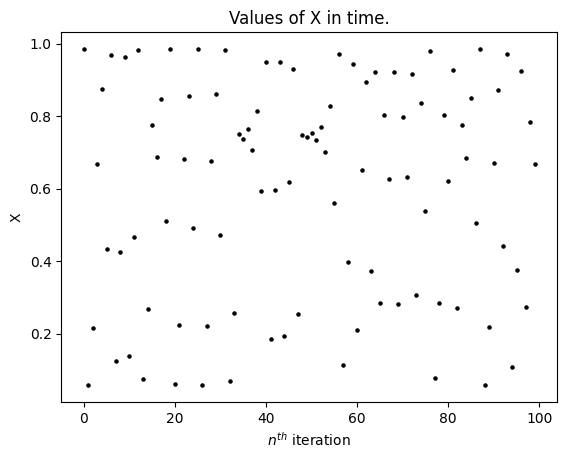

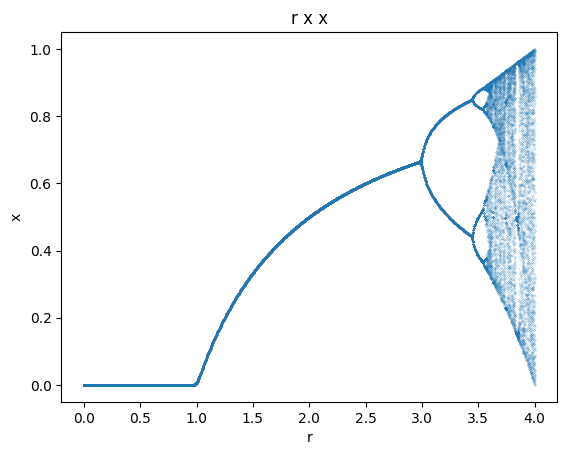

In [ ]:
a = Chaos(initial_values, logistic)
a.init_chaos()
a.show_graph('x')
a.show_bifurcation_graph('r', 0, 4, 1000, 'x', 100)

In [ ]:
a.init_chaos()
array1 = a.create_array(1000)['x']

In [ ]:
a.init_chaos()
array2 = a.create_array(1000)['x']

In [ ]:
array1 == array2

True

In [ ]:
print(array2)

[0.8790364284458035, 0.425325543644197, 0.9776949022718612, 0.087230321373908, 0.31848476962765093, 0.8682088845714921, 0.4576888692904703, 0.9928390728723243, 0.028438593001391222, 0.11051935771796978, 0.3932193171503089, 0.9543915430806147, 0.17411330230727154, 0.5751914410677129, 0.9773849887606426, 0.0884142900240045, 0.32238881337422287, 0.8738170655415335, 0.4410432060396674, 0.9860963857836755, 0.05484121491219235, 0.2073346242365883, 0.6573879113170441, 0.900916181485033, 0.35706486169384016, 0.9182781849495959, 0.3001734399810866, 0.8402773836440304, 0.5368452087214934, 0.9945697223770783, 0.021603158831438773, 0.0845458494397696, 0.30959139512910966, 0.8549782527644847, 0.4959617602570945, 0.9999347704791153, 0.0002609010639773175, 0.001043331978448532, 0.004168973747325115, 0.016606373620876917, 0.06532240790416304, 0.2442215637190607, 0.7383095661347099, 0.7728342027547453, 0.70224599122873, 0.8363862361276339, 0.5473772005755351, 0.9910216034625021, 0.0355911397324533, 0.1

In [ ]:
print(array1)

[0.8790364284458035, 0.425325543644197, 0.9776949022718612, 0.087230321373908, 0.31848476962765093, 0.8682088845714921, 0.4576888692904703, 0.9928390728723243, 0.028438593001391222, 0.11051935771796978, 0.3932193171503089, 0.9543915430806147, 0.17411330230727154, 0.5751914410677129, 0.9773849887606426, 0.0884142900240045, 0.32238881337422287, 0.8738170655415335, 0.4410432060396674, 0.9860963857836755, 0.05484121491219235, 0.2073346242365883, 0.6573879113170441, 0.900916181485033, 0.35706486169384016, 0.9182781849495959, 0.3001734399810866, 0.8402773836440304, 0.5368452087214934, 0.9945697223770783, 0.021603158831438773, 0.0845458494397696, 0.30959139512910966, 0.8549782527644847, 0.4959617602570945, 0.9999347704791153, 0.0002609010639773175, 0.001043331978448532, 0.004168973747325115, 0.016606373620876917, 0.06532240790416304, 0.2442215637190607, 0.7383095661347099, 0.7728342027547453, 0.70224599122873, 0.8363862361276339, 0.5473772005755351, 0.9910216034625021, 0.0355911397324533, 0.1

# Folded Towel Map

In [ ]:
def folded_towel(values_dict):
    x = values_dict.get('x')
    y = values_dict.get('y')
    z = values_dict.get('z')
    alpha = values_dict.get('alpha')
    beta = values_dict.get('beta')

    new_x = alpha*x*(1-x)-.05*(y+.35)*(1-2*z)
    new_y = .1*((y+.35)*(1+2*z)-1)*(1-1.9*x)
    new_z = 3.78*z*(1-z)+beta*y

    new_dict = dict()
    new_dict['x'] = new_x
    new_dict['y'] = new_y
    new_dict['z'] = new_z

    return new_dict

In [ ]:
variables = {
    'x': 0.085,
    'y': -0.121,
    'z': 0.075,
    'alpha': 3.8,
    'beta': .1,
    'iterations': 400
}

In [ ]:
c = Chaos(variables, folded_towel)
c.init_chaos()

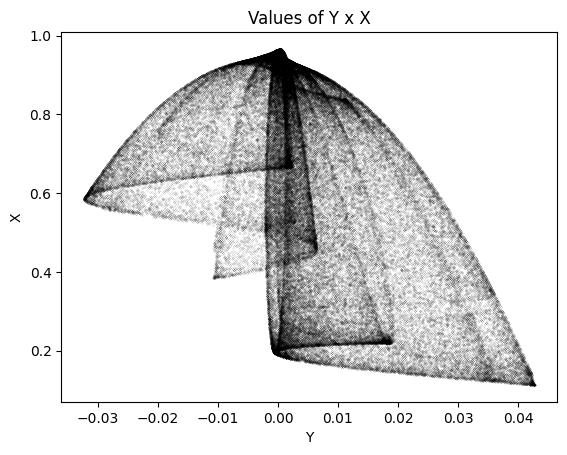

In [ ]:
c.show_graph('y', 'x', size=100000)

<ipython-input-66-20125d79840c>:9: RuntimeWarning: overflow encountered in double_scalars
  new_y = .1*((y+.35)*(1+2*z)-1)*(1-1.9*x)
<ipython-input-66-20125d79840c>:8: RuntimeWarning: overflow encountered in double_scalars
  new_x = alpha*x*(1-x)-.05*(y+.35)*(1-2*z)
<ipython-input-66-20125d79840c>:10: RuntimeWarning: overflow encountered in double_scalars
  new_z = 3.78*z*(1-z)+beta*y
<ipython-input-66-20125d79840c>:10: RuntimeWarning: invalid value encountered in double_scalars
  new_z = 3.78*z*(1-z)+beta*y
<ipython-input-66-20125d79840c>:8: RuntimeWarning: invalid value encountered in double_scalars
  new_x = alpha*x*(1-x)-.05*(y+.35)*(1-2*z)


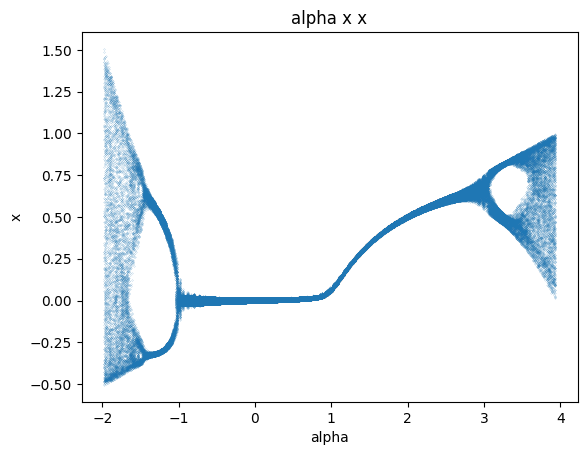

In [ ]:
c.show_bifurcation_graph('alpha', -2, 3.99999, 1000, 'x', 100)

# 9D Hyperchaos

Rayleigh-Bénard, from http://www.scholarpedia.org/article/Hyperchaos


In [ ]:
def chaotic_9D(values_dict):
        c1 = values_dict.get('c1')
        c2 = values_dict.get('c2')
        c3 = values_dict.get('c3')
        c4 = values_dict.get('c4')
        c5 = values_dict.get('c5')
        c6 = values_dict.get('c6')
        c7 = values_dict.get('c7')
        c8 = values_dict.get('c8')
        c9 = values_dict.get('c9')
        s = values_dict.get("sigma")
        r = values_dict.get("r")


        a = s
        a_1_2 = 1+a**2

        b1 = 4*(a_1_2 / (1 + 2 * a ** 2))
        b2 = (1+2*a**2)/(2*a_1_2)
        b3 = 2*((1-a**2)/a_1_2)
        b4 = a ** 2 / a_1_2
        b5 = (8*a**2)/(1+2*a**2)
        b6 = 4/(1+2*a**2)

        squarer = lambda x: x%30000

        new_c1 = squarer((-s*b1*c1 - c2*c4 + b4*c4**2 + b3*c3*c5 - s*b2*c7)+c1)
        new_c2 = squarer((-s*c2 + c1*c4 - c2*c5 + c4*c5 -s*c9/2)+c2)
        new_c3 = squarer((-s*b1*c3+ c2*c4 -b4*c2**2 - b3*c1*c5 + s*b2*c8)+c3)
        new_c4 = squarer((-s*c4 - c2*c3 - c2*c5 + c4*c5 + s*c9/2)+c4)
        new_c5 = squarer((-s*b5*c5 + c2**2/2 - c4**2/2)+c5)
        new_c6 = squarer((-b6*c6 + c2*c9 - c4*c9)+c6)
        new_c7 = squarer((-b1*c7 - r*c1 + 2*c5*c8 - c4*c9)+c7)
        new_c8 = squarer((-b1*c8 + r*c3 - 2*c5*c7 + c2*c9)+c8)
        new_c9 = squarer((-c9 - r*c2 + r*c4 - 2*c2*c6 + 2*c4*c6 + c4*c7 - c2*c8)+c9)


        new_dict = {
            "c1": new_c1,
            "c2": new_c2,
            "c3": new_c3,
            "c4": new_c4,
            "c5": new_c5,
            "c6": new_c6,
            "c7": new_c7,
            "c8": new_c8,
            "c9": new_c9,
        }
        return new_dict

In [ ]:
variables = {}
for key, val in zip(["c1","c2","c3","c4","c5","c6","c7","c8","c9"], [0,.1,0,0,0,0,0,0,0]):
    variables[key]=val

constants = {
        "sigma" : a,
        "r"     : 43.3,
        'iterations': 1000
}


In [ ]:
b = Chaos(variables|constants, chaotic_9D)

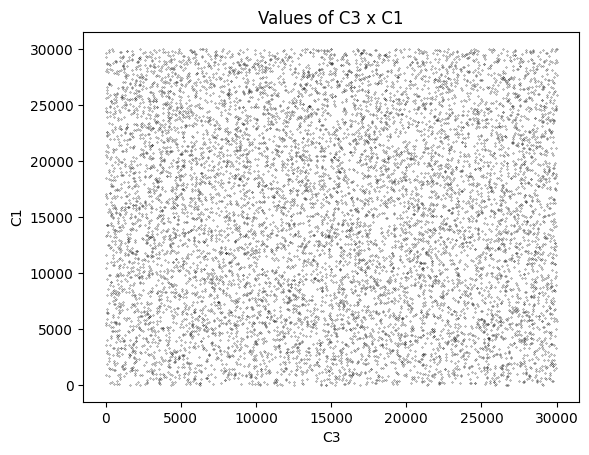

In [ ]:
b.show_graph('c3', 'c1', size=10000)

##################################################


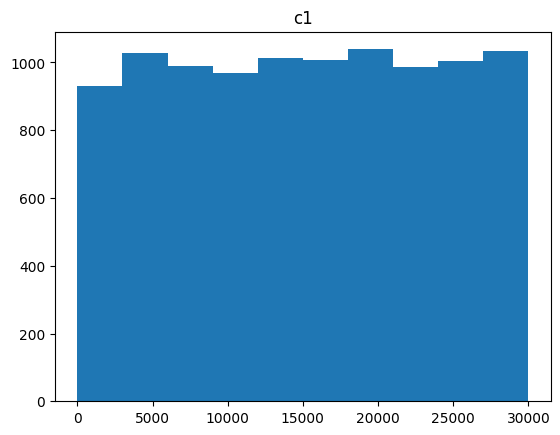

##################################################


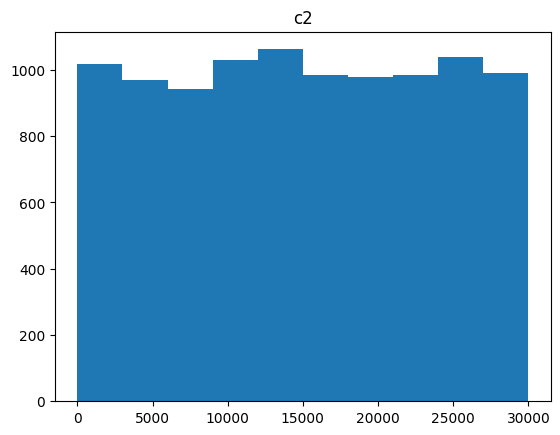

##################################################


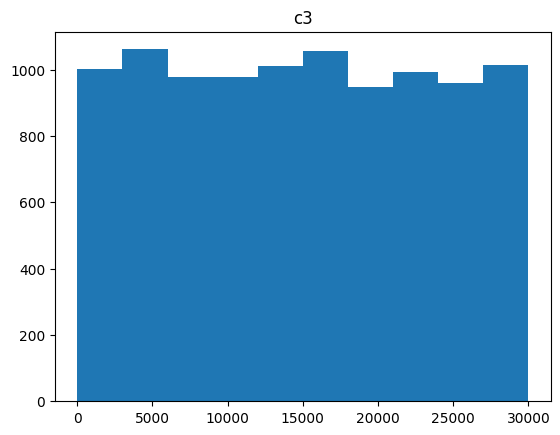

##################################################


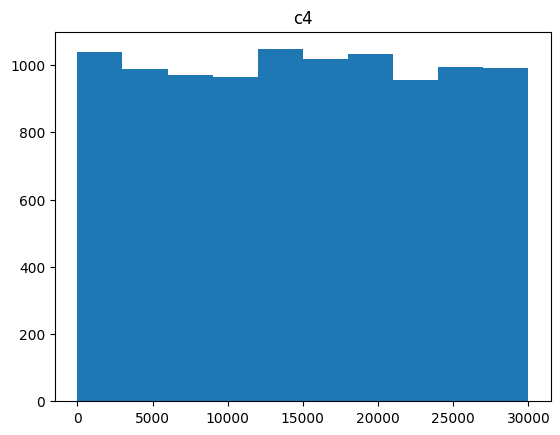

##################################################


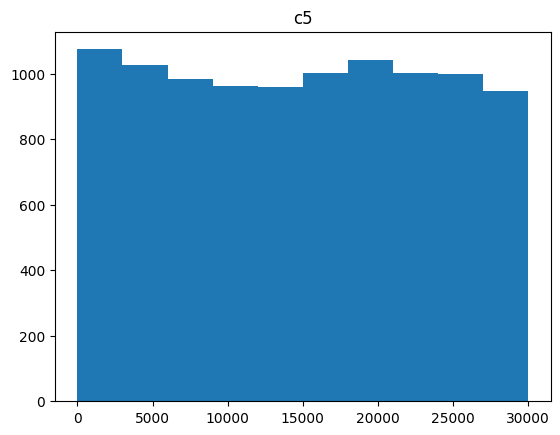

##################################################


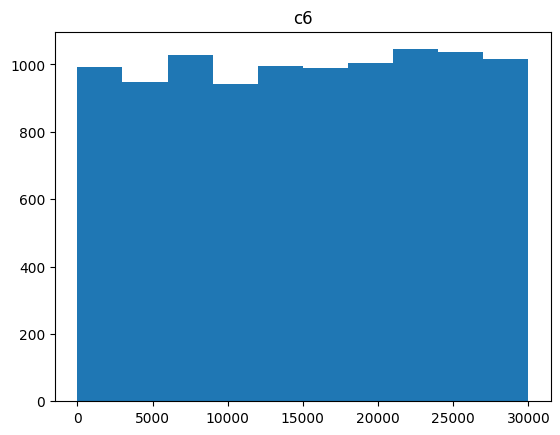

##################################################


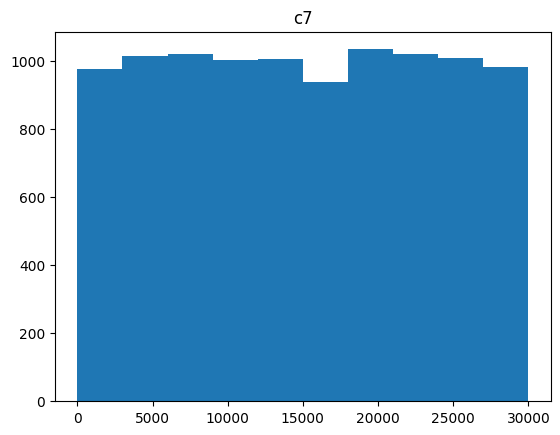

##################################################


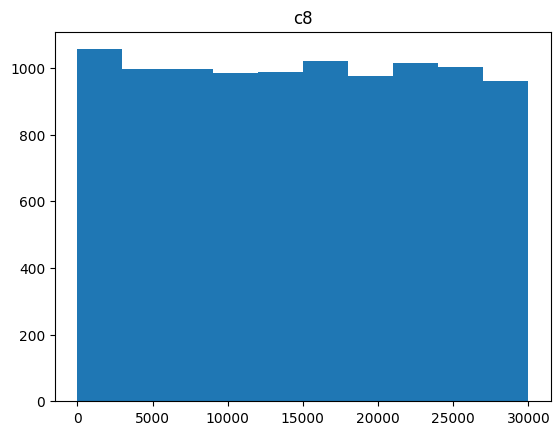

##################################################


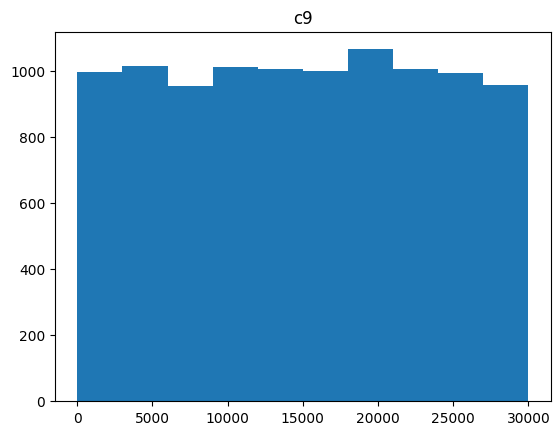

##################################################


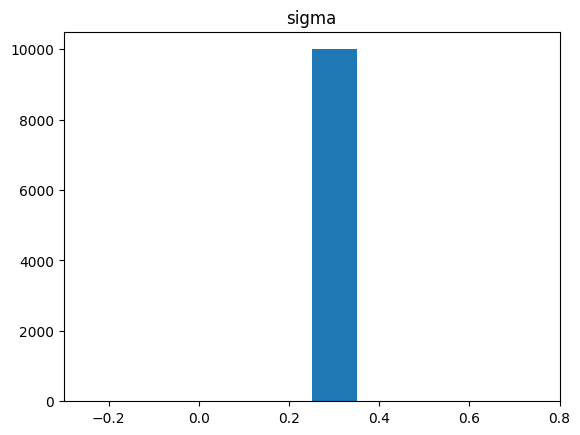

##################################################


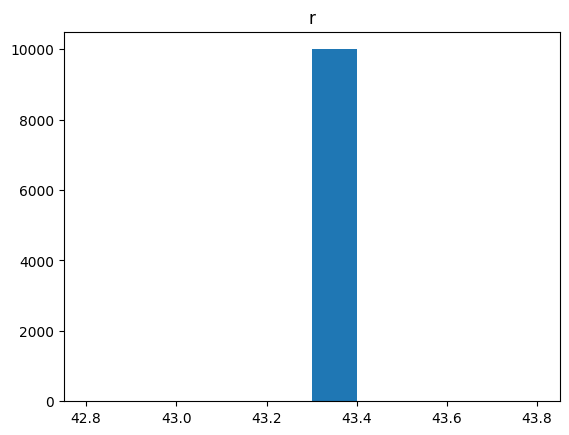

##################################################


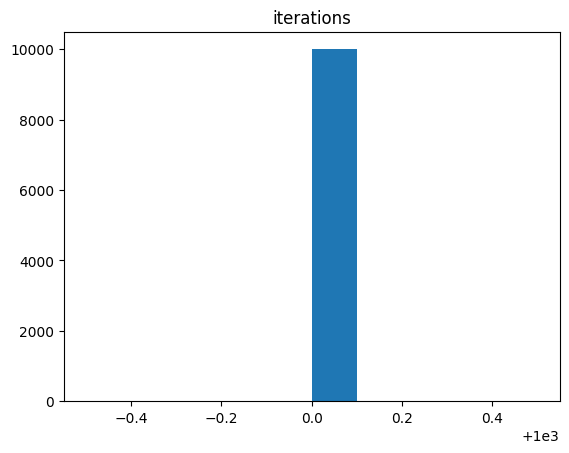

In [ ]:
b.show_histogram(size=10000)

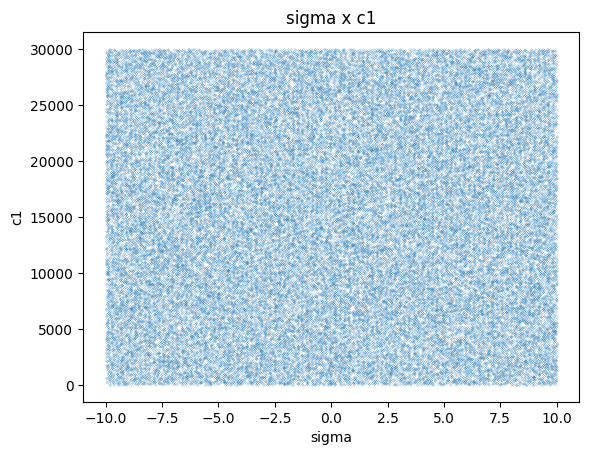

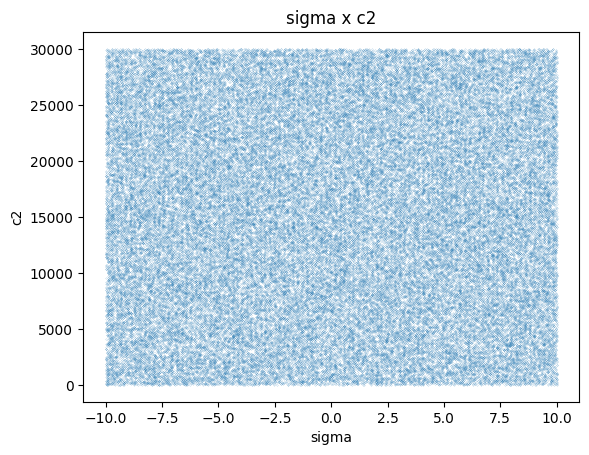

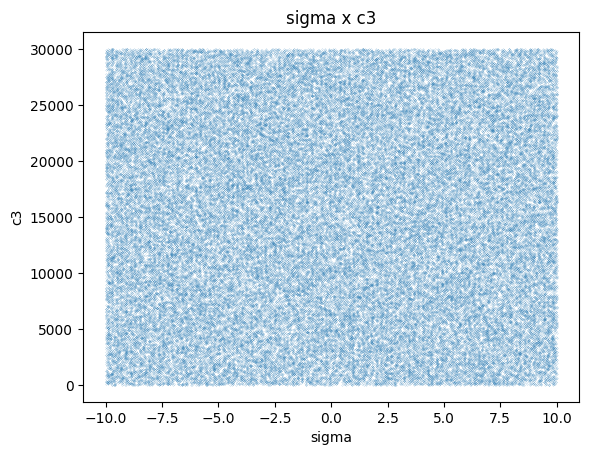

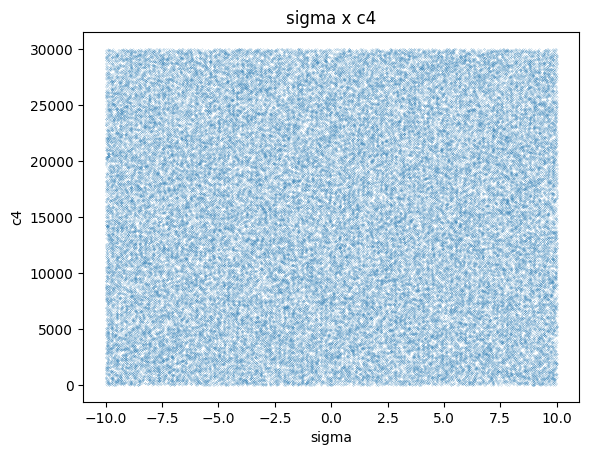

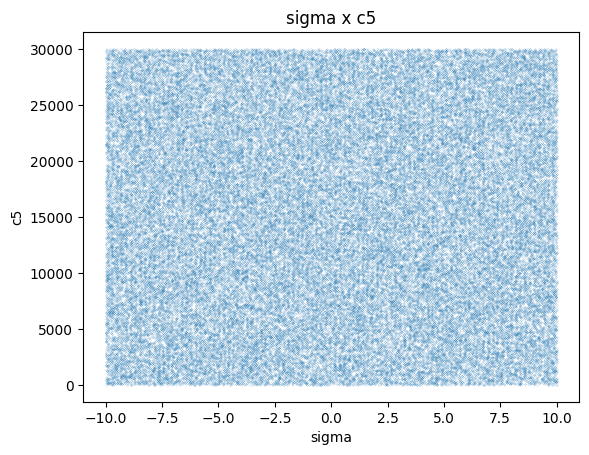

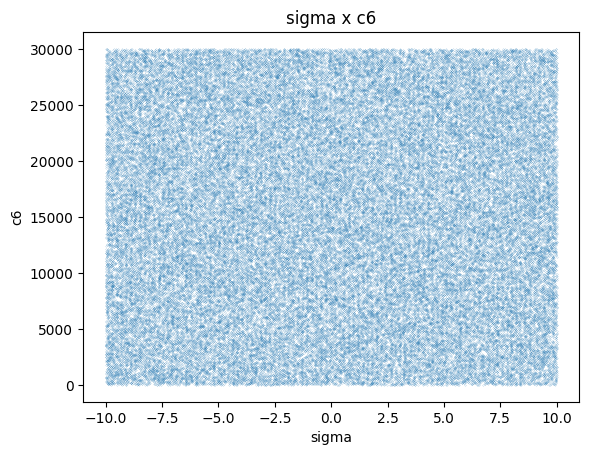

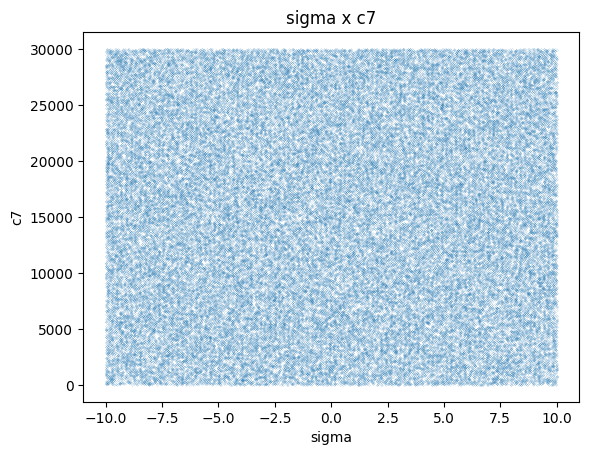

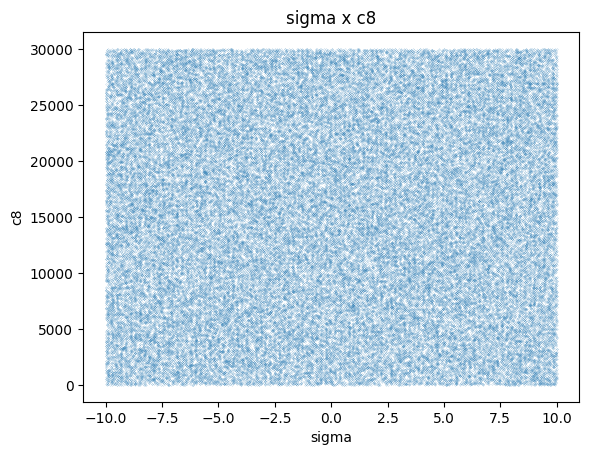

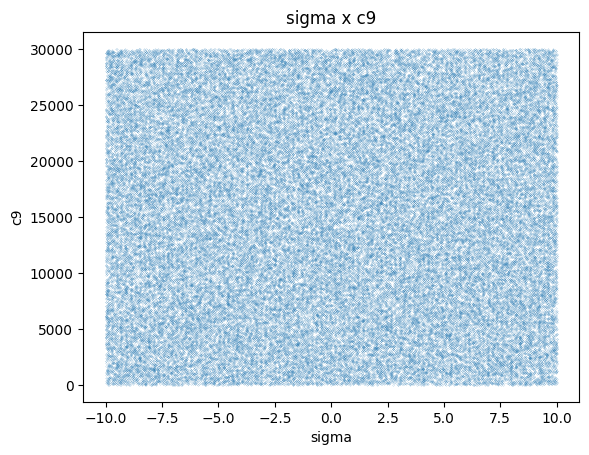

In [ ]:
for constant in ['sigma']:
    for variable in ["c1", "c2", "c3", "c4", "c5", "c6", "c7", "c8", "c9"]:
        b.show_bifurcation_graph(constant, -10, 10, 1000, variable, 100)

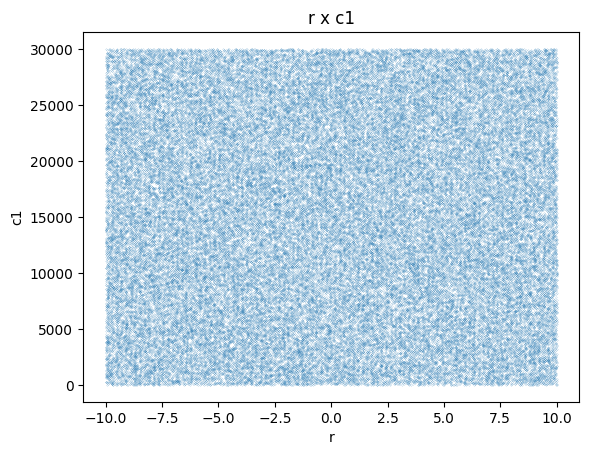

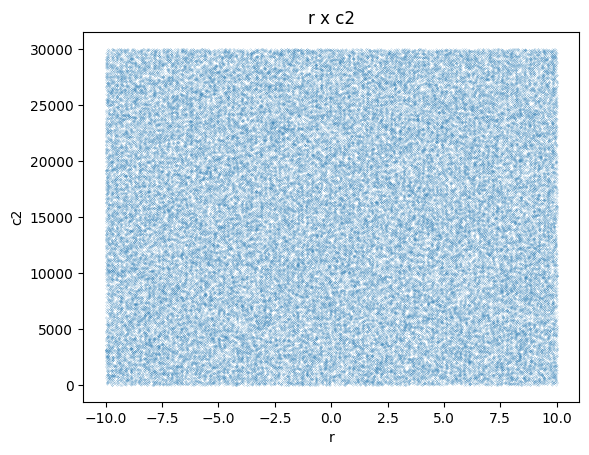

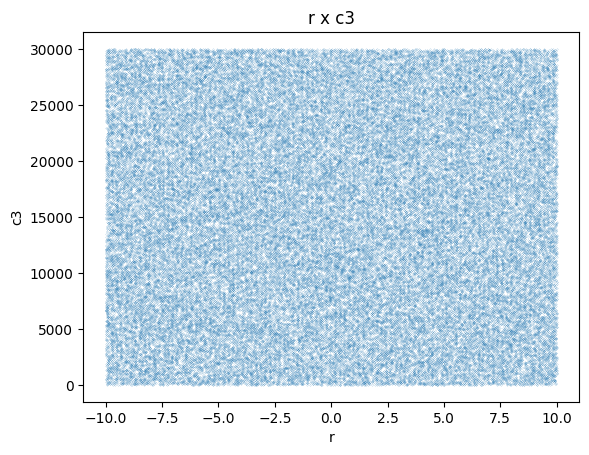

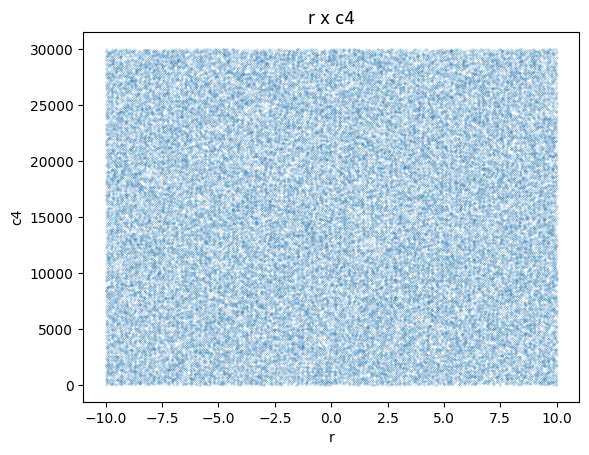

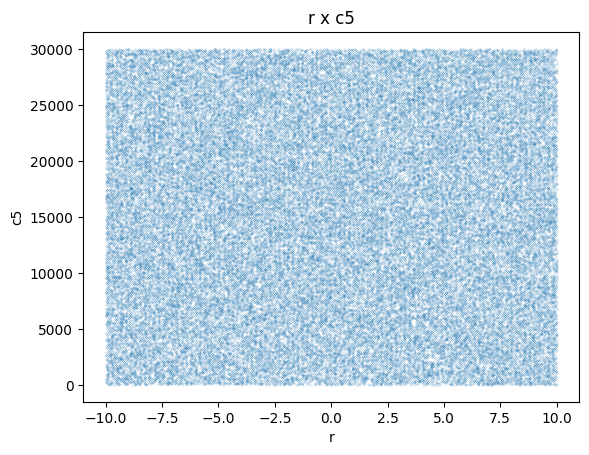

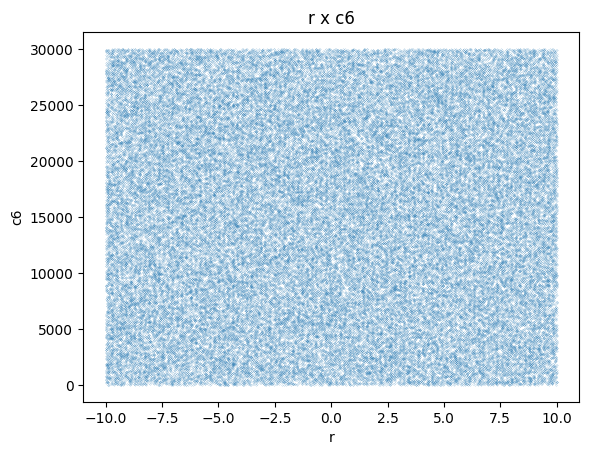

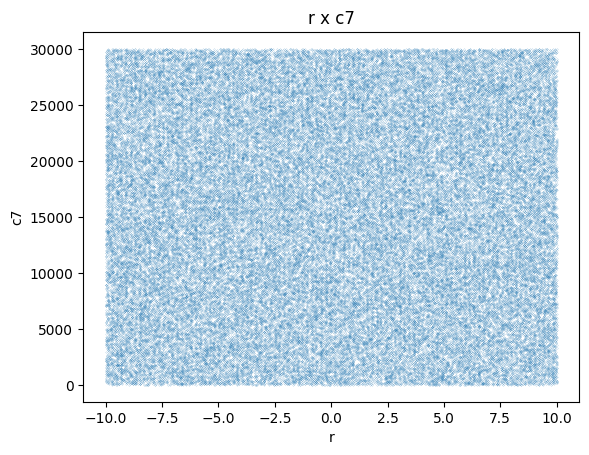

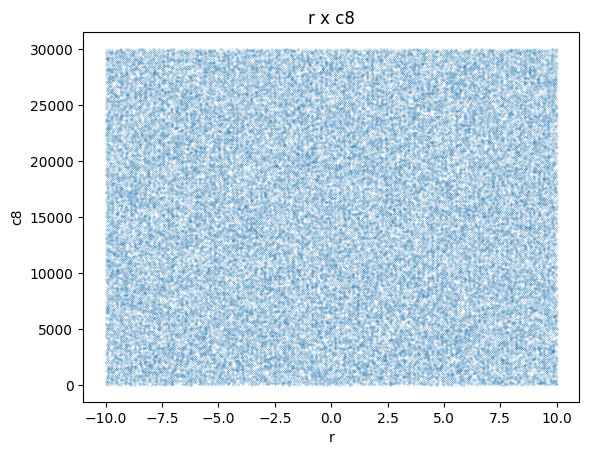

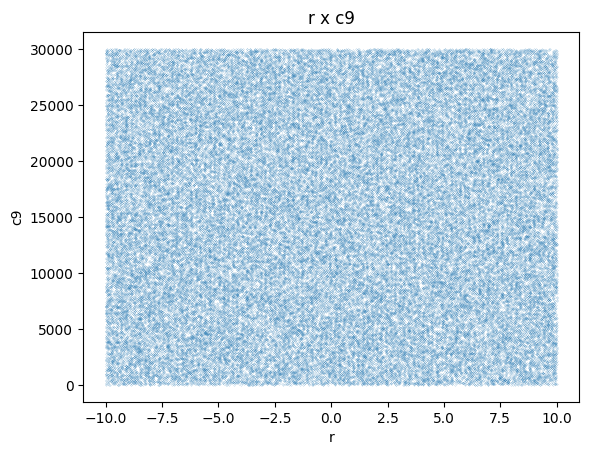

In [ ]:
for constant in ['r']:
    for variable in ["c1", "c2", "c3", "c4", "c5", "c6", "c7", "c8", "c9"]:
        b.show_bifurcation_graph(constant, -10, 10, 1000, variable, 100)